In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import f1_score

In [22]:
import warnings
warnings.filterwarnings('ignore')

## Data Load

In [2]:
train = pd.read_csv('./train.csv')
test = pd.read_csv('./test.csv')
sample_submission = pd.read_csv('./sample_submission.csv')
origin = pd.read_csv('./horse.csv')

train["is_generated"] = 1
test["is_generated"] = 1
origin["is_generated"] = 0

# Drop column id
train.drop('id',axis=1,inplace=True)
test.drop('id',axis=1,inplace=True)

train_total = pd.concat([train, origin], ignore_index=True)
train_total.drop_duplicates(inplace=True)

total = pd.concat([train_total, test], ignore_index=True)


print('The shape of the train data:', train.shape)
print('The shape of the test data:', test.shape)
print('The shape of the total data:', total.shape)

The shape of the train data: (1235, 29)
The shape of the test data: (824, 28)
The shape of the total data: (2358, 29)


In [3]:
outcome = {"died":0, "euthanized":1, "lived":2}
train_total["outcome"] = train_total["outcome"].map(outcome)

In [4]:
num_var = [column for column in train.columns if train[column].nunique() > 10]

bin_var = [column for column in train.columns if train[column].nunique() == 2]

cat_var = ['temp_of_extremities', 'peripheral_pulse', 'mucous_membrane','capillary_refill_time','pain',
'peristalsis','abdominal_distention','nasogastric_tube','nasogastric_reflux','rectal_exam_feces','abdomen',
'abdomo_appearance','lesion_2','surgery', 'age', 'surgical_lesion', 'lesion_3', 'cp_data']

target = 'outcome'

In [5]:
print(cat_var)

['temp_of_extremities', 'peripheral_pulse', 'mucous_membrane', 'capillary_refill_time', 'pain', 'peristalsis', 'abdominal_distention', 'nasogastric_tube', 'nasogastric_reflux', 'rectal_exam_feces', 'abdomen', 'abdomo_appearance', 'lesion_2', 'surgery', 'age', 'surgical_lesion', 'lesion_3', 'cp_data']


In [6]:
train_total.describe().T


,count,mean,std,min,25%,50%,75%,max
hospital_number,1534.0,980469.409387,1.392849e+06,518476.0,528806.0,529840.0,534259.25,5305629.0
rectal_temp,1474.0,38.196744,7.798830e-01,35.4,37.8,38.2,38.60,40.8
pulse,1510.0,78.194702,2.916252e+01,30.0,52.0,72.0,96.00,184.0
respiratory_rate,1476.0,30.120596,1.665080e+01,8.0,18.0,28.0,36.00,96.0
nasogastric_reflux_ph,1288.0,4.395963,1.939516e+00,1.0,2.0,4.5,6.20,7.5
packed_cell_volume,1505.0,49.011296,1.059043e+01,23.0,42.0,48.0,55.00,75.0
total_protein,1501.0,21.899534,2.681306e+01,3.3,6.6,7.5,13.00,89.0
abdomo_protein,1336.0,3.271931,1.621415e+00,0.1,2.0,3.0,4.30,10.1
lesion_1,1534.0,3798.817471,5.429908e+03,0.0,2124.0,2209.0,3205.00,41110.0
lesion_2,1534.0,29.409387,3.367483e+02,0.0,0.0,0.0,0.00,7111.0


## ordinal encoder correlation

In [60]:
ordinal_encoder = OrdinalEncoder()

In [61]:
ord_df = train_total.copy()

In [62]:
ord_df[cat_var] = ordinal_encoder.fit_transform(train_total[cat_var])

In [63]:
ord_outcome_corr = ord_df.corr().outcome.abs()

In [64]:
index = ord_outcome_corr.index
feature = []
for idx, i in enumerate(ord_outcome_corr):
    if i > 0.2:
        if not index[idx] == "outcome":
            feature.append(index[idx])

In [65]:
feature

['pulse',
 'temp_of_extremities',
 'capillary_refill_time',
 'packed_cell_volume',
 'abdomo_appearance',
 'surgical_lesion']

## Preprocessing & Feature Selection

In [7]:
from scipy import stats

In [8]:
# Preprocessing
from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler, PowerTransformer, QuantileTransformer, OrdinalEncoder, LabelEncoder
from sklearn.impute import SimpleImputer

In [9]:
def chi_squared_test(df, input_var, target_var, significance_level=0.05):
    contingency_table = pd.crosstab(df[input_var], df[target_var])
    chi2, p, _, _ = stats.chi2_contingency(contingency_table)
    
    if p < significance_level:
        print(f'\033[32m{input_var} has a significant relationship with the target variable.\033[0m') 
    else:
        print(f'\033[31m{input_var} does not have a significant relationship with the target variable.\033[0m')  

for i in cat_var:
    chi_squared_test(train, i, target)

temp_of_extremities has a significant relationship with the target variable.
peripheral_pulse has a significant relationship with the target variable.
mucous_membrane has a significant relationship with the target variable.
capillary_refill_time has a significant relationship with the target variable.
pain has a significant relationship with the target variable.
peristalsis has a significant relationship with the target variable.
abdominal_distention has a significant relationship with the target variable.
nasogastric_tube has a significant relationship with the target variable.
nasogastric_reflux has a significant relationship with the target variable.
rectal_exam_feces has a significant relationship with the target variable.
abdomen has a significant relationship with the target variable.
abdomo_appearance has a significant relationship with the target variable.
lesion_2 has a significant relationship with the target variable.
surgery has a significant relationship with the target va

In [10]:
total[target] = total[target].map({'died':0,'euthanized':1,'lived':2})

In [11]:
def preprocessing(df, le_cols, ohe_cols):
    
    # Label Encoding for binary cols
    le = LabelEncoder()    
    for col in le_cols:
        df[col] = le.fit_transform(df[col])
    
    # OneHot Encoding for category cols
    df = pd.get_dummies(df, columns = ohe_cols)
    
    df["pain"] = df["pain"].replace('slight', 'moderate')
    df["peristalsis"] = df["peristalsis"].replace('distend_small', 'normal')
    df["rectal_exam_feces"] = df["rectal_exam_feces"].replace('serosanguious', 'absent')
    df["nasogastric_reflux"] = df["nasogastric_reflux"].replace('slight', 'none')
        
    df["temp_of_extremities"] = df["temp_of_extremities"].fillna("normal").map({'cold': 0, 'cool': 1, 'normal': 2, 'warm': 3})
    df["peripheral_pulse"] = df["peripheral_pulse"].fillna("normal").map({'absent': 0, 'reduced': 1, 'normal': 2, 'increased': 3})
    df["capillary_refill_time"] = df["capillary_refill_time"].fillna("3").map({'less_3_sec': 0, '3': 1, 'more_3_sec': 2})
    df["pain"] = df["pain"].fillna("depressed").map({'alert': 0, 'depressed': 1, 'moderate': 2, 'mild_pain': 3, 'severe_pain': 4, 'extreme_pain': 5})
    df["peristalsis"] = df["peristalsis"].fillna("hypomotile").map({'hypermotile': 0, 'normal': 1, 'hypomotile': 2, 'absent': 3})
    df["abdominal_distention"] = df["abdominal_distention"].fillna("none").map({'none': 0, 'slight': 1, 'moderate': 2, 'severe': 3})
    df["nasogastric_tube"] = df["nasogastric_tube"].fillna("none").map({'none': 0, 'slight': 1, 'significant': 2})
    df["nasogastric_reflux"] = df["nasogastric_reflux"].fillna("none").map({'less_1_liter': 0, 'none': 1, 'more_1_liter': 2})
    df["rectal_exam_feces"] = df["rectal_exam_feces"].fillna("absent").map({'absent': 0, 'decreased': 1, 'normal': 2, 'increased': 3})
    df["abdomen"] = df["abdomen"].fillna("distend_small").map({'normal': 0, 'other': 1, 'firm': 2,'distend_small': 3, 'distend_large': 4})
    df["abdomo_appearance"] = df["abdomo_appearance"].fillna("serosanguious").map({'clear': 0, 'cloudy': 1, 'serosanguious': 2})

    return df    

In [12]:
total = preprocessing(total, le_cols = ["surgery", "age", "surgical_lesion", "cp_data"], ohe_cols = ["mucous_membrane"])

In [13]:
def features_engineering(df):
    # df['lesion_2'] = df['lesion_2'].apply(lambda x:1 if x>0 else 0)
    data_preprocessed = df.copy()
    
    # Imputer 
    cols_with_nan = df.drop(target,axis=1).columns[df.drop(target,axis=1).isna().any()].tolist()

    for feature in cols_with_nan:
        data_preprocessed[feature].fillna(data_preprocessed[feature].mode()[0], inplace=True)
    
    return data_preprocessed

# train = features_engineering(train)
total = features_engineering(total)

In [14]:
df_train = total[total[target].notna()]
df_test = total[total[target].isna()]
df_test.drop(target,axis=1,inplace=True)

/var/folders/h5/gswr1sjs3pg7jdl_fq608b5m0000gp/T/ipykernel_51482/1648331807.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test.drop(target,axis=1,inplace=True)


In [15]:
full_features = df_test.columns.tolist()
bin_features = df_test.select_dtypes('bool').columns

df_train[bin_features] = df_train[bin_features].astype('int64')
df_test[bin_features] = df_test[bin_features].astype('int64')

In [16]:
df_train.head()

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,capillary_refill_time,pain,...,cp_data,outcome,is_generated,mucous_membrane_None,mucous_membrane_bright_pink,mucous_membrane_bright_red,mucous_membrane_dark_cyanotic,mucous_membrane_normal_pink,mucous_membrane_pale_cyanotic,mucous_membrane_pale_pink
0,1,0,530001,38.1,132.0,24.0,1.0,1.0,2.0,1.0,...,0,0.0,1,0,0,0,1,0,0,0
1,1,0,533836,37.5,88.0,12.0,1.0,2.0,2.0,3.0,...,0,1.0,1,0,0,0,0,0,1,0
2,1,0,529812,38.3,120.0,28.0,1.0,1.0,0.0,5.0,...,0,2.0,1,0,0,0,0,0,0,1
3,1,0,5262541,37.1,72.0,30.0,0.0,1.0,2.0,3.0,...,1,2.0,1,0,0,0,0,0,0,1
4,0,0,5299629,38.0,52.0,48.0,2.0,2.0,0.0,0.0,...,1,2.0,1,0,0,0,0,1,0,0


In [17]:
# Metrics
def caculate_f1(y_true, y_pred):
    return f1_score(y_true, y_pred, average = 'micro')

In [18]:
# Model Selection
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split, GridSearchCV, RepeatedStratifiedKFold
#import autogluon as ag

# Models
from sklearn.ensemble import HistGradientBoostingClassifier, GradientBoostingClassifier, AdaBoostClassifier,RandomForestClassifier,ExtraTreesClassifier,VotingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
import optuna


In [19]:
lgbm_baseline = LGBMClassifier(n_estimators=1000,
                     max_depth=10,
                     random_state=42)

f1_results = pd.DataFrame(columns=['Selected_Features', 'F1'])

def evaluation(df, select_features, note):
    global f1_results
    
    X = df[select_features]
    Y = df[target]
    
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    f1_scores = []
    
    for train_idx, test_idx in kf.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = Y.iloc[train_idx], Y.iloc[test_idx]
        
        lgbm_baseline.fit(X_train, y_train)
        y_hat = lgbm_baseline.predict(X_test) 
        f1 = caculate_f1(y_test, y_hat)
        f1_scores.append(f1)
    
    average_f1 = np.mean(f1_scores)
    new_row = {'Selected_Features': note, 'F1': average_f1}
    f1_results = pd.concat([f1_results, pd.DataFrame([new_row])], ignore_index=True)

    # f1_results = f1_results.append({'Selected_Features': note, 'F1': average_f1}, ignore_index=True)
    print('====================================')
    print(note)
    print("Average F1:", average_f1)
    print('====================================')
    return average_f1

In [23]:
evaluation(df=df_train,select_features=full_features,note='Baseline')

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 625
[LightGBM] [Info] Number of data points in the train set: 1022, number of used features: 31
[LightGBM] [Info] Start training from score -1.133459
[LightGBM] [Info] Start training from score -1.677243
[LightGBM] [Info] Start training from score -0.710917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[L

0.732067687948467

In [24]:
def correlation(dataset, threshold):
    col_corr = set()  
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) >= threshold: 
                colname = corr_matrix.columns[i]                  
                col_corr.add(colname)
    return col_corr      

corr_features = correlation(df_train, 0.35)
corr_features


{'abdominal_distention',
 'abdomo_protein',
 'capillary_refill_time',
 'cp_data',
 'is_generated',
 'lesion_3',
 'mucous_membrane_normal_pink',
 'packed_cell_volume',
 'peripheral_pulse',
 'peristalsis',
 'rectal_exam_feces',
 'respiratory_rate',
 'surgical_lesion',
 'temp_of_extremities',
 'total_protein'}

In [25]:
corr_features = df_test.drop(['abdominal_distention',
 'abdomo_protein',
 'capillary_refill_time',
 'cp_data',
 'lesion_3',
 'mucous_membrane_dark_cyanotic',
 'mucous_membrane_normal_pink',
 'packed_cell_volume',
 'peripheral_pulse',
 'peristalsis',
 'rectal_exam_feces',
 'respiratory_rate',
 'surgical_lesion',
 'temp_of_extremities',
 'total_protein'],axis=1).columns.tolist()

In [26]:
evaluation(df=df_train,select_features=corr_features,note='Corr Features')

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 408
[LightGBM] [Info] Number of data points in the train set: 1022, number of used features: 17
[LightGBM] [Info] Start training from score -1.133459
[LightGBM] [Info] Start training from score -1.677243
[LightGBM] [Info] Start training from score -0.710917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[L

0.7138092180365297

In [29]:
import seaborn as sns

In [30]:
def f_importance_plot(f_imp):
    fig = plt.figure(figsize=(12, 0.20*len(f_imp)))
    plt.title(f'Feature importances', size=16, y=1.05, 
              fontweight='bold')
    a = sns.barplot(data=f_imp, x='imp', y='feature', linestyle="-", 
                    linewidth=0.5, edgecolor="black",palette='GnBu')
    plt.xlabel('')
    plt.xticks([])
    plt.ylabel('')
    plt.yticks(size=11)
    
    for j in ['right', 'top', 'bottom']:
        a.spines[j].set_visible(False)
    for j in ['left']:
        a.spines[j].set_linewidth(0.5)
    plt.tight_layout()
    plt.show()

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 661
[LightGBM] [Info] Number of data points in the train set: 1534, number of used features: 32
[LightGBM] [Info] Start training from score -1.147370
[LightGBM] [Info] Start training from score -1.648659
[LightGBM] [Info] Start training from score -0.712898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[L

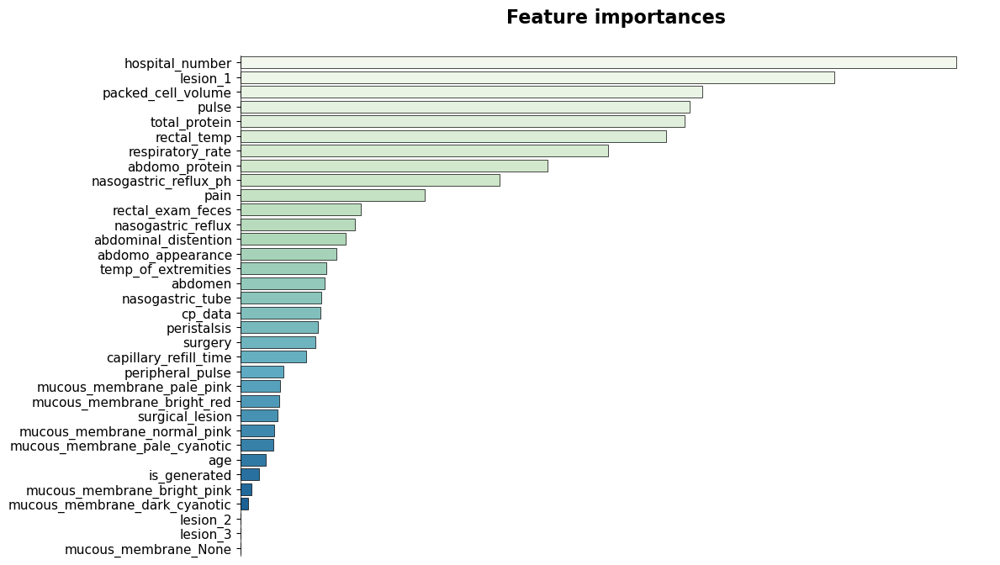

In [31]:
clf = LGBMClassifier(n_estimators=1000,
                     max_depth=10,
                     random_state=42)
clf.fit(df_train.drop(target,axis=1), df_train[target])

f_imp_df = pd.DataFrame({'feature': df_train.drop(target,axis=1).columns, 'imp': clf.feature_importances_})
f_imp_df.sort_values(by='imp',ascending=False,inplace=True)
f_importance_plot(f_imp_df)

In [33]:
best_score = 0
best_feature_num = 0
for i in range(1,f_imp_df.shape[0]):
    feature = f_imp_df.head(i).feature.to_list()
    # print(f'Trying top {i} features...')
    score = evaluation(df=df_train,select_features=feature,note=f'Top {i} Features')
    if score > best_score:
        best_score = score
        best_feature_num = i

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 225
[LightGBM] [Info] Number of data points in the train set: 1022, number of used features: 1
[LightGBM] [Info] Start training from score -1.133459
[LightGBM] [Info] Start training from score -1.677243
[LightGBM] [Info] Start training from score -0.710917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

In [35]:
best_feature_num, best_score

(26, 0.7392355165525114)

In [36]:
print(f'Best feature number is Top {best_feature_num}, Best score is {best_score}')

Best feature number is Top 26, Best score is 0.7392355165525114


In [37]:
best_features = f_imp_df.head(best_feature_num).feature.to_list()

In [38]:
best_features

['hospital_number',
 'lesion_1',
 'packed_cell_volume',
 'pulse',
 'total_protein',
 'rectal_temp',
 'respiratory_rate',
 'abdomo_protein',
 'nasogastric_reflux_ph',
 'pain',
 'rectal_exam_feces',
 'nasogastric_reflux',
 'abdominal_distention',
 'abdomo_appearance',
 'temp_of_extremities',
 'abdomen',
 'nasogastric_tube',
 'cp_data',
 'peristalsis',
 'surgery',
 'capillary_refill_time',
 'peripheral_pulse',
 'mucous_membrane_pale_pink',
 'mucous_membrane_bright_red',
 'surgical_lesion',
 'mucous_membrane_normal_pink']

## NN by pytorch

In [47]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [43]:
device = torch.device("mps")

In [40]:
def imputing_nan(df):
    data_preprocessed = df.copy()
    # Imputer 
    cols_with_nan = df.columns[df.isna().any()].tolist()
    for feature in cols_with_nan:
        data_preprocessed[feature].fillna(data_preprocessed[feature].mode()[0], inplace=True)
            
    return data_preprocessed

df_train = imputing_nan(df_train)
df_test = imputing_nan(df_test)

In [41]:
df_train

,surgery,age,hospital_number,rectal_temp,pulse,respiratory_rate,temp_of_extremities,peripheral_pulse,capillary_refill_time,pain,...,cp_data,outcome,is_generated,mucous_membrane_None,mucous_membrane_bright_pink,mucous_membrane_bright_red,mucous_membrane_dark_cyanotic,mucous_membrane_normal_pink,mucous_membrane_pale_cyanotic,mucous_membrane_pale_pink
0,1,0,530001,38.1,132.0,24.0,1.0,1.0,2.0,1.0,...,0,0.0,1,0,0,0,1,0,0,0
1,1,0,533836,37.5,88.0,12.0,1.0,2.0,2.0,3.0,...,0,1.0,1,0,0,0,0,0,1,0
2,1,0,529812,38.3,120.0,28.0,1.0,1.0,0.0,5.0,...,0,2.0,1,0,0,0,0,0,0,1
3,1,0,5262541,37.1,72.0,30.0,0.0,1.0,2.0,3.0,...,1,2.0,1,0,0,0,0,0,0,1
4,0,0,5299629,38.0,52.0,48.0,2.0,2.0,0.0,0.0,...,1,2.0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1529,1,0,533886,38.0,120.0,70.0,0.0,2.0,2.0,1.0,...,0,1.0,0,0,0,0,0,0,1,0
1530,0,0,527702,37.2,72.0,24.0,1.0,3.0,2.0,4.0,...,1,1.0,0,0,0,0,0,0,1,0
1531,1,0,529386,37.5,72.0,30.0,0.0,1.0,0.0,4.0,...,0,0.0,0,0,0,0,0,0,1,0
1532,1,0,530612,36.5,100.0,24.0,1.0,1.0,0.0,3.0,...,1,2.0,0,0,0,0,0,0,0,1


In [66]:
train_set = torch.tensor(df_train[feature].values,dtype=torch.float32).to(device)
train_target = torch.tensor(df_train[target].values,dtype=torch.long).to(device)

pred_set = torch.tensor(df_test[feature].values,dtype=torch.float32).to(device)

In [67]:
train_set.shape

torch.Size([1534, 6])

In [68]:
class Model(nn.Module):

    def __init__(self):
        super().__init__()
        self.layer_1=nn.Linear(train_set.shape[1],128)
        #self.layer_2=nn.Linear(256,128)
        self.layer_2=nn.Linear(128,3)
        self.dropout=nn.Dropout(p=0.5)
        self.relu = nn.ReLU()

    def forward(self,x):
        x = x
        x = self.layer_1(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.layer_2(x)
        x = nn.Softmax()(x)
        return x

In [69]:
criterion = nn.CrossEntropyLoss()
model = Model().to(device)
optimizer = optim.AdamW(model.parameters(),lr=1e-3,weight_decay=1e-3)

loss_history = []

for epoch in range(600):
    pred = model(train_set)
    pred = pred.squeeze()
    
    loss = criterion(pred, train_target)
    loss_history.append(loss.item())
    
    if epoch % 50 == 0 :
        print(loss)
        
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
train_steps = range(1, len(loss_history) + 1)

tensor(1.1704, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0612, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0612, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0612, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0612, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0606, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0613, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0612, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0612, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0612, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0612, device='mps:0', grad_fn=<NllLossBackward0>)
tensor(1.0612, device='mps:0', grad_fn=<NllLossBackward0>)


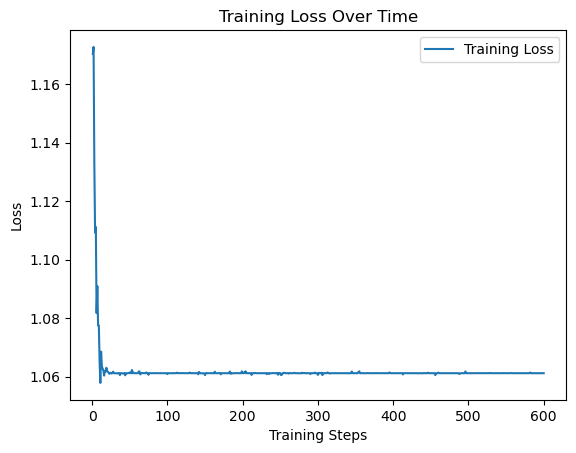

In [70]:
plt.plot(train_steps, loss_history, label='Training Loss')
plt.xlabel('Training Steps')
plt.ylabel('Loss')
plt.legend()
plt.title('Training Loss Over Time')
plt.show()

In [71]:
preds = []
pred=model(pred_set)
preds.append(pred)
prediction = []
class_indices = torch.argmax(pred, dim=1)
class_mapping = {0: 'died', 1: 'euthanized', 2: 'lived'}
prediction = [class_mapping[i.item()] for i in class_indices]

In [72]:
nn_submission = pd.DataFrame({'id': sample_submission['id'], 'outcome': prediction})
nn_submission.outcome.value_counts()

lived    824
Name: outcome, dtype: int64

## Torch

In [73]:
from sklearn.metrics import f1_score

In [74]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [75]:
device = torch.device("mps")

In [76]:
class Model(nn.Module):

    def __init__(self, in_features=6, out_features=3, h1=256, h2 = 128):
        super().__init__()
        self.fc1 = nn.Linear(in_features, h1)
        self.fc2 = nn.Linear(h1, h2)
        self.fc3 = nn.Linear(h2, out_features)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return F.log_softmax(x, dim=1)

In [77]:
torch.manual_seed(32)
model = Model(in_features=28)

In [78]:
# train_df = train.copy()
# train_df[cat_var]= ordinal_encoder.fit_transform(train[cat_var])
# train_df[target] = train_df[target].map(outcome)

In [79]:
train_df = train.copy()
train_df[cat_var]= ordinal_encoder.fit_transform(train[cat_var])
train_df[target] = train_df[target].map(outcome)

In [80]:
X, y = train_df[train_df.columns.difference([target])].values, train_df[target].values

In [81]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [82]:
X

array([[ 2. ,  4. ,  3. , ...,  1. ,  2. ,  8.5],
       [ 2. ,  1. ,  3. , ...,  1. ,  2. , 64. ],
       [ 1. ,  1. ,  3. , ...,  1. ,  2. ,  6.4],
       ...,
       [ 3. ,  4. ,  2. , ...,  1. ,  3. ,  5.9],
       [ 2. ,  4. ,  2. , ...,  1. ,  3. , 74. ],
       [ 2. ,  2. ,  1. , ...,  1. ,  3. ,  6. ]])

In [83]:
X_train_torch = torch.FloatTensor(X_train)
X_test_torch = torch.FloatTensor(X_test)
y_train_torch = torch.LongTensor(y_train)
y_test_torch = torch.LongTensor(y_test)

In [84]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

In [85]:
epochs = 600
losses = []

for i in range(epochs):
    # Forward and get a prediction

    y_pred = model.forward(X_train_torch)

    # Calculate Loss/Error
    loss = criterion(y_pred, y_train_torch)

    losses.append(loss)

    if i%10 == 0 :
        print(f"epoch {i} loss is: {loss}")

    # Backpropagation

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()


epoch 0 loss is: 4733.69580078125
epoch 10 loss is: 33416.13671875
epoch 20 loss is: 2132.32080078125
epoch 30 loss is: 661.3390502929688
epoch 40 loss is: 154.53321838378906
epoch 50 loss is: 1.2184828519821167
epoch 60 loss is: 1.1249195337295532
epoch 70 loss is: 1.1132853031158447
epoch 80 loss is: 1.101025104522705
epoch 90 loss is: 1.0899560451507568
epoch 100 loss is: 1.0805786848068237
epoch 110 loss is: 1.0728838443756104
epoch 120 loss is: 1.0666861534118652
epoch 130 loss is: 1.0617573261260986
epoch 140 loss is: 1.0578749179840088
epoch 150 loss is: 1.0548416376113892
epoch 160 loss is: 1.0524882078170776
epoch 170 loss is: 1.0506744384765625
epoch 180 loss is: 1.04928457736969
epoch 190 loss is: 1.0482263565063477
epoch 200 loss is: 1.0474241971969604
epoch 210 loss is: 1.0468201637268066
epoch 220 loss is: 1.0463672876358032
epoch 230 loss is: 1.0460296869277954
epoch 240 loss is: 1.045779824256897
epoch 250 loss is: 1.0455950498580933
epoch 260 loss is: 1.045460104942321

Text(0.5, 0, 'Epoch')

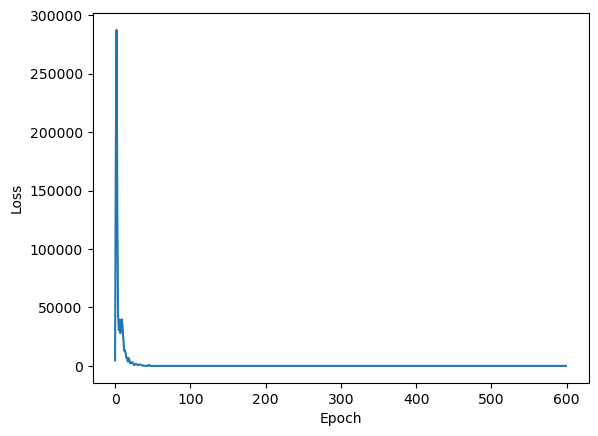

In [86]:
fl = [l.item() for l in losses]
plt.plot(range(epochs), fl)
plt.ylabel("Loss")
plt.xlabel("Epoch")

In [87]:
preds = []
pred=model(X_test_torch)
preds.append(pred)
prediction = []
class_indices = torch.argmax(pred, dim=1)

In [88]:
f1_score(class_indices, y_test, average="micro")

0.4852941176470588